# 6.1.2 Sourcing Open Data

## Contents List: 

1. Import Visualization Libraries and Data
2. Categorical Plots
3. Key Questions
4. Additional Visualizations

## 1. Import Visualization Libraries and Data

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os

In [2]:
# charts are displayed in the notebook without the need to "call" them specifically
%matplotlib inline

In [4]:
# import original data set "dairy_wrangled.csv"
df = pd.read_csv(os.path.join(path, '02 Data','Prepared Data', 'dairy_wrangled.csv'))

In [5]:
df.shape

(4325, 23)

In [6]:
df.columns

Index(['Unnamed: 0', 'Location', 'Total Land Area (acres)', 'Number of Cows',
       'Farm Size', 'Date', 'Product Name', 'Brand', 'Quantity (liters/kg)',
       'Price per Unit', 'Total Value', 'Shelf Life (days)',
       'Storage Condition', 'Production Date', 'Expiration Date',
       'Quantity Sold (liters/kg)', 'Price per Unit (sold)',
       'Approx. Total Revenue(INR)', 'Customer Location', 'Sales Channel',
       'Quantity in Stock (liters/kg)', 'Minimum Stock Threshold (liters/kg)',
       'Reorder Quantity (liters/kg)'],
      dtype='object')

# 2. Categorical Plots

In [7]:
# Examine variable types and create df with categorical variables
# Print data types of each column
print(df.dtypes)

Unnamed: 0                               int64
Location                                object
Total Land Area (acres)                float64
Number of Cows                           int64
Farm Size                               object
Date                                    object
Product Name                            object
Brand                                   object
Quantity (liters/kg)                   float64
Price per Unit                         float64
Total Value                            float64
Shelf Life (days)                        int64
Storage Condition                       object
Production Date                         object
Expiration Date                         object
Quantity Sold (liters/kg)                int64
Price per Unit (sold)                  float64
Approx. Total Revenue(INR)             float64
Customer Location                       object
Sales Channel                           object
Quantity in Stock (liters/kg)            int64
Minimum Stock

In [8]:
# Create a DataFrame with only categorical / object columns
categorical_df = df.select_dtypes(include=['object', 'category'])

In [9]:
print(categorical_df.dtypes)

Location             object
Farm Size            object
Date                 object
Product Name         object
Brand                object
Storage Condition    object
Production Date      object
Expiration Date      object
Customer Location    object
Sales Channel        object
dtype: object


<Axes: xlabel='Price per Unit', ylabel='Count'>

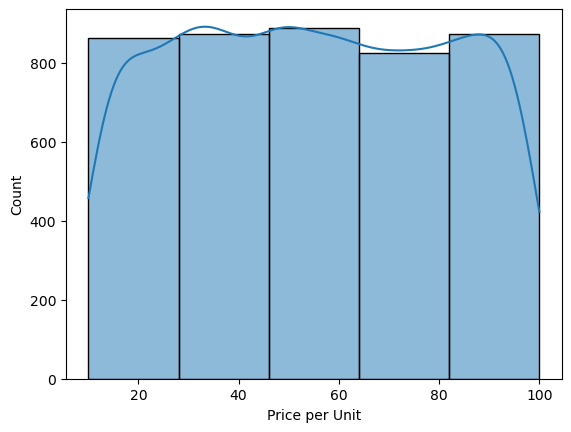

In [10]:
# Histogram for 'Price per Unit'

sns.histplot(df['Price per Unit'], bins = 5, kde = True)

There seems to be a similar count for each price point, ranging from a count of about 150 to about 190.

In [11]:
# Split 'Price per Unit' into categories

In [12]:
df.loc[(df['Price per Unit'] > 10) & (df['Price per Unit'] < 28), 'Price category'] = 'Low price'

In [13]:
df.loc[(df['Price per Unit'] >= 28) & (df['Price per Unit'] < 47), 'Price category'] = 'Low Medium price'

In [14]:
df.loc[(df['Price per Unit'] >= 47) & (df['Price per Unit'] < 69), 'Price category'] = 'Medium price'

In [15]:
df.loc[(df['Price per Unit'] >= 69) & (df['Price per Unit'] < 90), 'Price category'] = 'Medium High price'

In [16]:
df.loc[df['Price per Unit'] >= 90, 'Price category'] = 'High price'

/Users/carolinelasersohn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


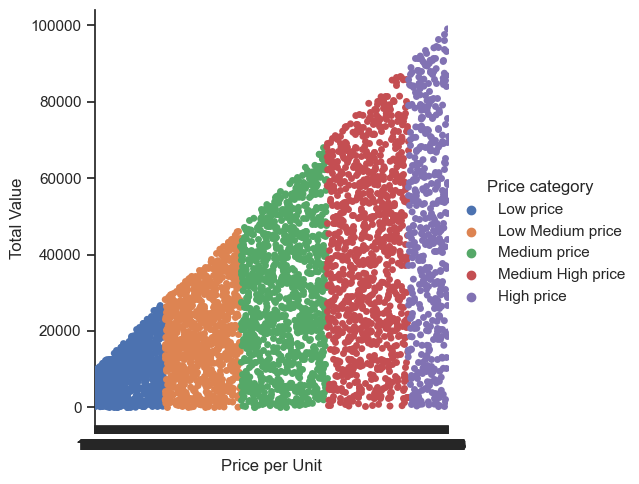

In [17]:
# Create a categorical plot in seaborn using the price categories created above

sns.set(style="ticks")
catplot_ppu_tv = sns.catplot(x="Price per Unit", y="Total Value", hue="Price category", data=df)

The data appeared uniformly spread, but there does seem to be some variation. The counts were surprising because the histogram showed something different. 

In [18]:
catplot_ppu_tv.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'catplot_ppu_tv.png'))

<Axes: xlabel='Quantity Sold (liters/kg)', ylabel='Count'>

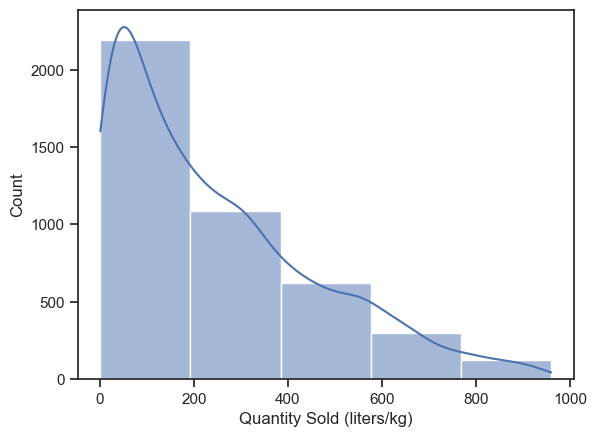

In [19]:
# Histogram for 'Quantity Sold (liters/kg)'

sns.histplot(df['Quantity Sold (liters/kg)'], bins = 5, kde = True)

The count decreases when quantity increases

In [20]:
# Split 'Price per Unit' into categories

In [21]:
df.loc[(df['Quantity Sold (liters/kg)'] < 333), 'Quantity category'] = 'Low Quantity'

In [22]:
df.loc[(df['Quantity Sold (liters/kg)'] >= 333) & (df['Quantity Sold (liters/kg)'] < 666), 'Quantity category'] = 'Medium Quantity'

In [23]:
df.loc[(df['Quantity Sold (liters/kg)'] >= 666) & (df['Quantity Sold (liters/kg)'] < 1000), 'Quantity category'] = 'High Quantity'

/Users/carolinelasersohn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/b9/y4g8ppyj2bs49xgy2tjbz9c00000gn/T/ipykernel_70937/1139244613.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, rotation=0)


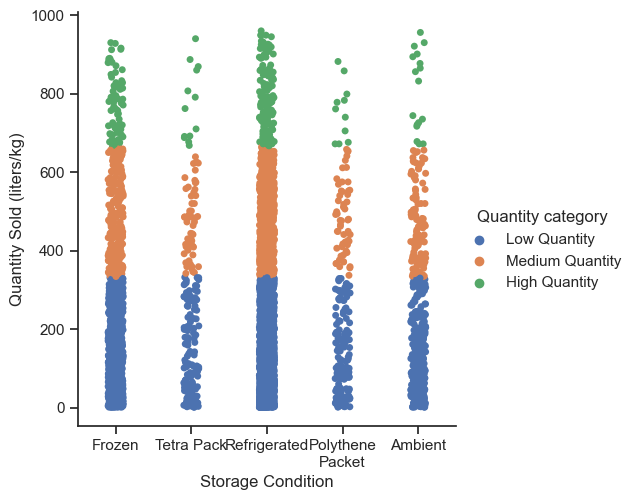

In [24]:
# Categorical plot using the 'Quantity categories' and 'Storage Condition'

import textwrap

# Function to wrap text for labels
def wrap_labels(ax, width):
    labels = [textwrap.fill(label.get_text(), width) for label in ax.get_xticklabels()]
    ax.set_xticklabels(labels, rotation=0)

sns.set(style="ticks")
catplot_ppu_tv = sns.catplot(x="Storage Condition", y="Quantity Sold (liters/kg)", hue="Quantity category", data=df)     
    
# Get the current axis
ax = catplot_ppu_tv.ax  

# Wrap x-axis labels
wrap_labels(ax, 12)  # Adjust the width as needed

# Show the plot
plt.show()

Refrigerated and Frozen products conditions tend to sell more quantity than Ambient, Polythene Packets, and Tetra. However there are some outlier items that sell a high quantity of products.

/Users/carolinelasersohn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/b9/y4g8ppyj2bs49xgy2tjbz9c00000gn/T/ipykernel_70937/2210024303.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, rotation=0)


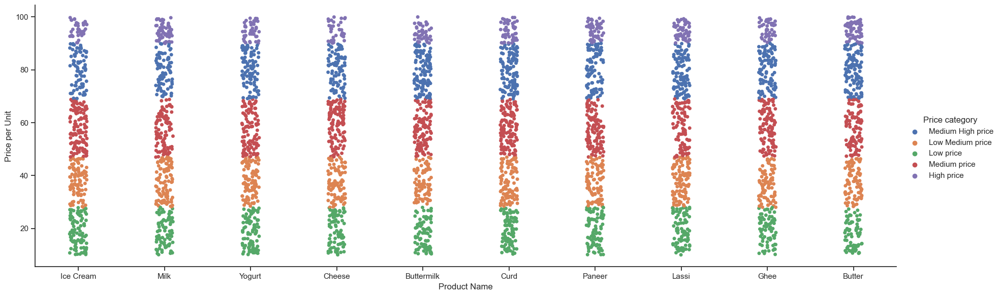

In [25]:
# Catplot for "Product Name" and "Price per Unit"

import textwrap

# Function to wrap text for labels
def wrap_labels(ax, width):
    labels = [textwrap.fill(label.get_text(), width) for label in ax.get_xticklabels()]
    ax.set_xticklabels(labels, rotation=0)

# Set the style
sns.set(style="ticks")

# Create the categorical plot with specified figure size
catplot_ppu_tv = sns.catplot(x="Product Name", y="Price per Unit", hue="Price category", data=df, height=6, aspect=3)

# Get the current axis
ax = catplot_ppu_tv.ax

# Wrap x-axis labels
wrap_labels(ax, 10)  # Adjust the width as needed

# Show the plot
plt.show()

the distribution of the price per unit for products are about the same. I'm not sure why there is a large range of price per unit for the same product. My hypothesis is either brands or location is correlated.

In [26]:
catplot_ppu_tv.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'catplot_ppu_tv.png'))

/Users/carolinelasersohn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/b9/y4g8ppyj2bs49xgy2tjbz9c00000gn/T/ipykernel_70937/1985808340.py:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, rotation=0)


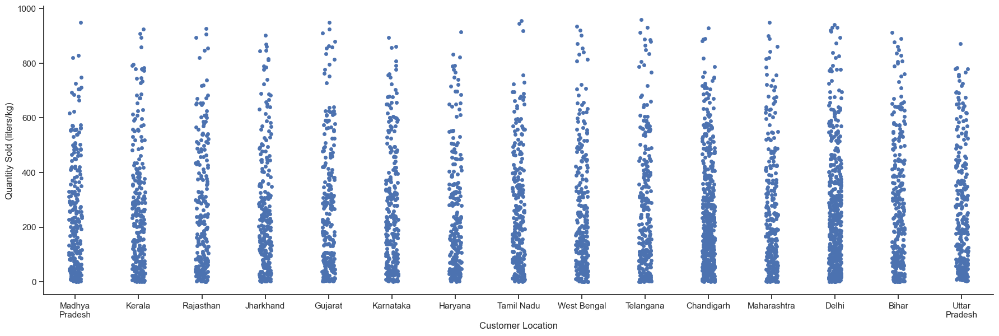

In [35]:
# Catplot for "Customer Location" and "Quantity Sold (liters/kg)" 

# Function to wrap text for labels
def wrap_labels(ax, width):
    labels = [textwrap.fill(label.get_text(), width) for label in ax.get_xticklabels()]
    ax.set_xticklabels(labels, rotation=0)

# Set the style
sns.set(style="ticks")

# Create the categorical plot with specified figure size
catplot_cl_qs = sns.catplot(x="Customer Location", y="Quantity Sold (liters/kg)", data=df, height=6, aspect=3)

# Get the current axis
ax = catplot_cl_qs.ax

# Wrap x-axis labels
wrap_labels(ax, 11)  # Adjust the width as needed

# Show the plot
plt.show()

Most customer locations seem to have about the same amount of quantity sold. There are some stand outs like Chandigarh and Delhi

In [36]:
catplot_cl_qs.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'catplot_cl_qs.png'))

/Users/carolinelasersohn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/b9/y4g8ppyj2bs49xgy2tjbz9c00000gn/T/ipykernel_70937/2483318899.py:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, rotation=0)


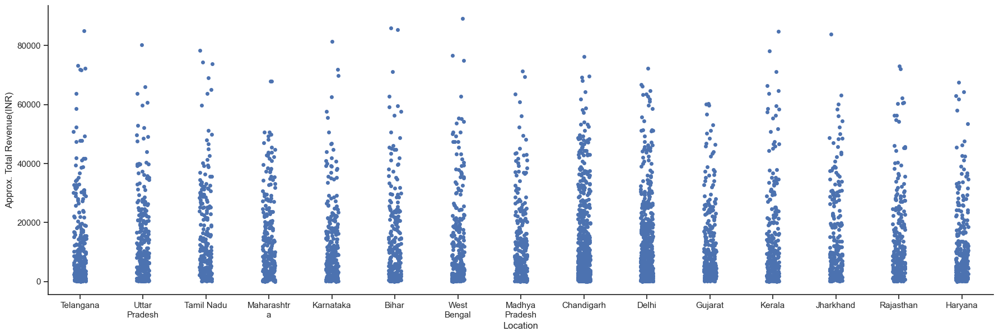

In [29]:
# Catplot for "Location" and "Approx. Total Revenue(INR)" 

# Function to wrap text for labels
def wrap_labels(ax, width):
    labels = [textwrap.fill(label.get_text(), width) for label in ax.get_xticklabels()]
    ax.set_xticklabels(labels, rotation=0)

# Set the style
sns.set(style="ticks")

# Create the categorical plot with specified figure size
catplot_l_atr = sns.catplot(x="Location", y="Approx. Total Revenue(INR)", data=df, height=6, aspect=3)

# Get the current axis
ax = catplot_l_atr.ax

# Wrap x-axis labels
wrap_labels(ax, 10)  # Adjust the width as needed

# Show the plot
plt.show()

There are differences between each location and ATR, with some locations producing more revenue that others. Also, there are some outliers like in Jharkhand and West Bengal.  But otherwise the spread for each location is similar.

In [30]:
catplot_l_atr.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'catplot_l_atr.png'))

/Users/carolinelasersohn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/b9/y4g8ppyj2bs49xgy2tjbz9c00000gn/T/ipykernel_70937/1294310728.py:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, rotation=0)


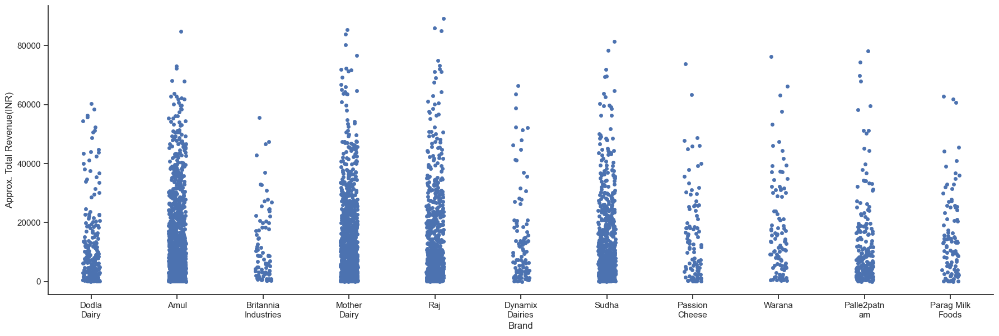

In [31]:
# Catplot for "Brand" and "Approx. Total Revenue(INR)" 

# Function to wrap text for labels
def wrap_labels(ax, width):
    labels = [textwrap.fill(label.get_text(), width) for label in ax.get_xticklabels()]
    ax.set_xticklabels(labels, rotation=0)

# Set the style
sns.set(style="ticks")

# Create the categorical plot with specified figure size
catplot_b_atr = sns.catplot(x="Brand", y="Approx. Total Revenue(INR)", data=df, height=6, aspect=3)

# Get the current axis
ax = catplot_b_atr.ax

# Wrap x-axis labels
wrap_labels(ax, 10)  # Adjust the width as needed

# Show the plot
plt.show()

Some brands clearly have more revenue than others, as well as more items than others. Comparing the low revenue brands and the high revenue brands could show us insights, like what variables influence these differences.

In [32]:
catplot_b_atr.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'catplot_b_atr.png'))

/Users/carolinelasersohn/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


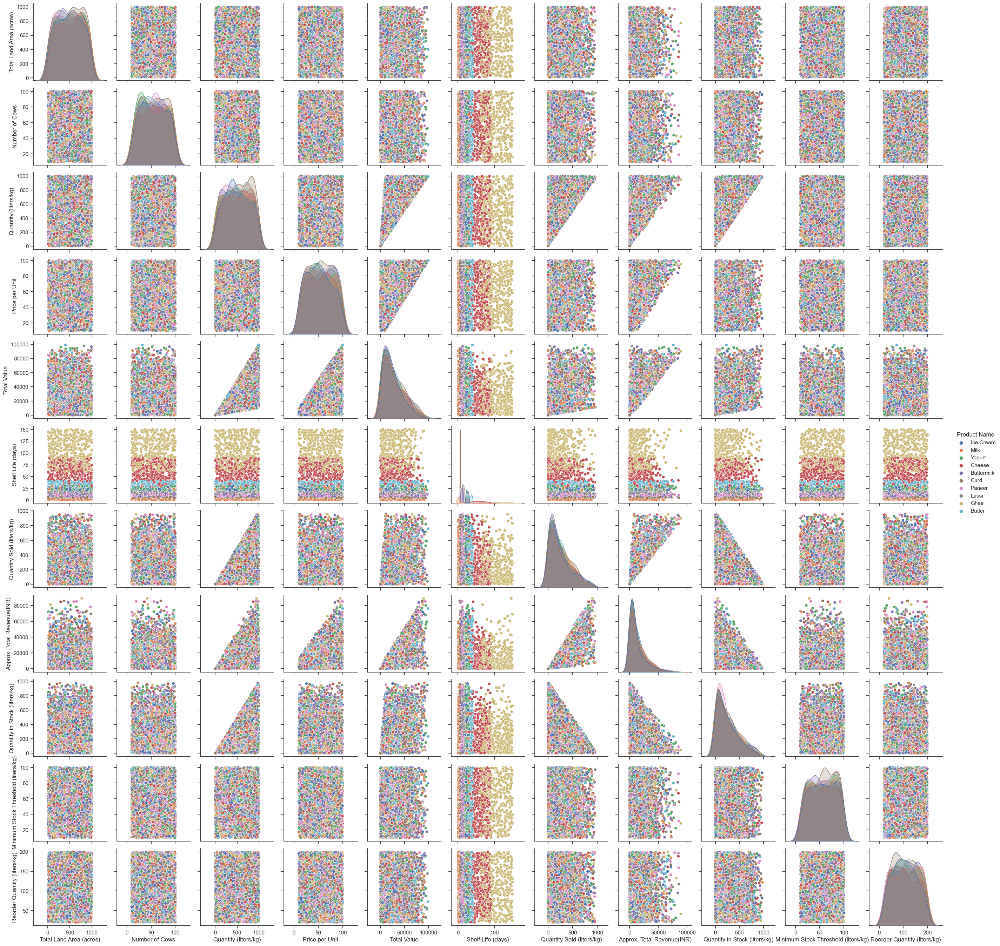

In [33]:
# Comparing numerical and categorical (Product Name) variables

# Select numerical variables and a categorical variable
numerical_vars = ['Total Land Area (acres)', 'Number of Cows', 'Quantity (liters/kg)', 
                  'Price per Unit', 'Total Value', 'Shelf Life (days)', 'Quantity Sold (liters/kg)', 'Approx. Total Revenue(INR)', 'Quantity in Stock (liters/kg)', 'Minimum Stock Threshold (liters/kg)', 'Reorder Quantity (liters/kg)']
categorical_var = 'Product Name' 

# Create pair plots
pairplot_pn_numerics = sns.pairplot(df[numerical_vars + [categorical_var]], hue=categorical_var)
plt.show()

The only case that has products grouped together is Shelf Life (days). Milk has the lowest shelf life and ghee has the highest. 

Shelf life does not appear to have a relationship with Total Land Area, Number of Cows, Quantity, Price per Unit, Minimum Stock Threshold, and Reorder Quantity. 

However, in terms of total value it appear that the longer the shelf life, total value decreases besdies a few outliers. The same applys to Quantity sold though not as strong of a correlation and similar to Quantity in Stock. ATR has the most drastic decrease. This could be because products that last a long time don't need to be purchased as much.

In [34]:
pairplot_pn_numerics.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'pairplot_pn_numerics.png'))

## 3. Key Questions

I found that I did not answer many questions specifically, because I was more focuses on learning about the new graphs. I did find some answers though they aren't as detailed as I'll do in the future:

What is the impact of different storage conditions on product quality and sales?
- Storage condition impact how much quantity is sold. Refrigerated and Frozen products conditions tend to sell more quantity than Ambient, Polythene Packets, and Tetra. However there are some outlier items that sell a high quantity of products.

How does the shelf life of products affect their sales and quality?
- The only case that has products grouped together is Shelf Life (days). Milk has the lowest shelf life and ghee has the highest. 
- Shelf life does not appear to have a relationship with Total Land Area, Number of Cows, Quantity, Price per Unit, Minimum Stock Threshold, and Reorder Quantity. 
- However, in terms of total value it appear that the longer the shelf life, total value decreases besdies a few outliers. The same applys to Quantity sold though not as strong of a correlation and similar to Quantity in Stock. ATR has the most drastic decrease. This could be because products that last a long time don't need to be purchased as much.

How does the performance (e.g., production volume, revenue) vary by geographical location? How do sales volumes and revenues vary across different regions? Across customer locations?
- Most customer locations seem to have about the same amount of quantity sold. There are some stand outs like Chandigarh and Delhi that appear to have more products sold.

What are the sales trends and patterns for different dairy products? 
- The distribution of the price per unit for products are about the same. I'm not sure why there is a large range of price per unit for the same product. My hypothesis is either brands or location is correlated.

What are the sales trends and patterns for different brands? Market share?
- Some brands clearly have more revenue than others, as well as more items than others. Comparing the low revenue brands and the high revenue brands could show us insights, like what variables influence these differences.


Some additional notes & questions:

- still need to explore data more to come up with a insightful hypothesis that goes beyond "Quantity Sold increases Approx. Total Revenue."    
- group production dates by month to look at how production and sales change per season or month
- group all products together for each brand
- which brands sell the most to each customer location?
- why are the same products priced differently? Is it due to brand or location? or something less obvious?